<div class="alert alert-info">
    
<h1 style="color:#1a96f6;"> <center> <b> 
Sinais e Sistemas
</b> </center> </h1>
    
<h3 style="color:#1a96f6;"> <center> <b> 
Lista de Exercícios - Transformações de sinais
</b></center> </h3>
    
</div>

<div class="alert alert-info" style="color:#1a96f6;">
Introdução

</div>

Nessa atividade, trabalharemos o efeito de cada uma das operações com um sinal real, de áudio, analisando como implementar a saída em cada um dos casos e observando os efeitos de cada transformação.

Vamos trabalhar, para esse processamento, com duas bibliotecas:

In [88]:
import scipy.io.wavfile as sw
import IPython.display as Id
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

A `scipy.io.wavfile` permite a leitura de um arquivo `.wav`, extraindo dele uma matriz com os valores das frequências e das intensidade de cada amostra do áudio.

`IPython.display` permite que escutemos o áudio dentro do próprio notebook.

Consideremos o áudio `zero.wav` como exemplo.

Para ler o arquivo, usaremos

In [89]:
fa,sinal = sw.read('data/atividade_8/zero.wav')

/tmp/ipykernel_11/3365423927.py:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fa,sinal = sw.read('data/atividade_8/zero.wav')


Aqui podemos ver que obtemos dois "subprodutos":

* a frequência de amostragem $f_a$

In [90]:
fa

22050

* e as medidas de intensidade do sinal em cada amostra

In [91]:
sinal

array([[ 60,  54],
       [102,  96],
       [ 52,  66],
       ...,
       [  9,  17],
       [  1,   5],
       [ -5,   0]], dtype=int16)

Note que a variável `sinal` é uma matriz com duas colunas 

In [92]:
sinal.shape

(56568, 2)

Isso se dá porque a gravação é estéreo e, portanto, tem componentes direita e esquerda (chamamos cada componente dessas de canal).

Podemos visualizar cada um desses canais como gráficos

Text(0.5, 1.0, 'Canal direito')

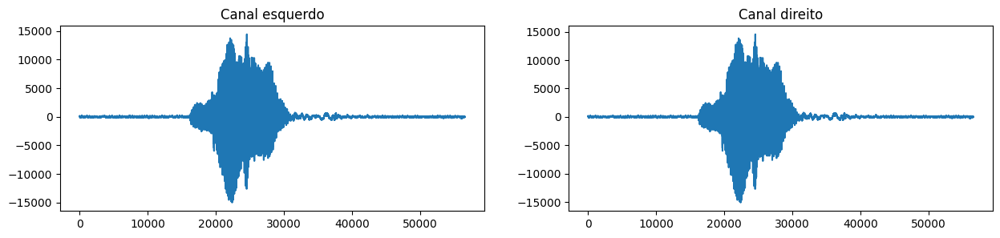

In [93]:
fig, axs = plt.subplots(1,2, figsize=(15, 3))
axs[0].plot(sinal[:,0])
axs[0].set_title('Canal esquerdo')
axs[1].plot(sinal[:,1])
axs[1].set_title('Canal direito')

E podemos ouví-lo também

In [94]:
Id.Audio('data/atividade_8/zero.wav')

___Uma questão: como ouvir o áudio de cada canal separadamente?___

<div class="alert alert-info" style="color:#1a96f6;">
1. Analise o efeito das transformações sobre o sinal de áudio <b><em>zero.wav</em></b>, observando tanto os efeitos no gráfico do sinal, quando no próprio áudio. Para isso, plote os gráficos e mostre os áudios de cada transformação solicitada a seguir. 
</div>

a) <br>

\begin{equation}
a \cdot s(t)
\end{equation}

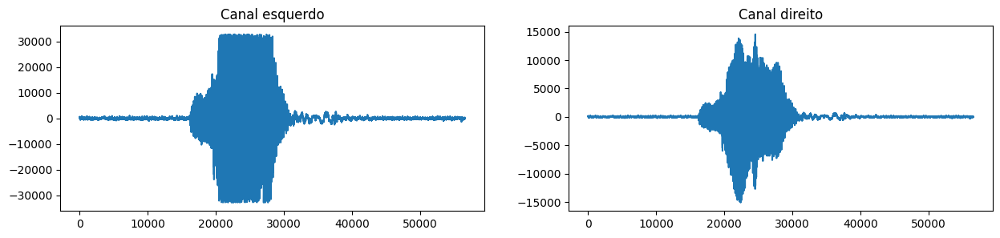

In [95]:
sinal_A = np.copy(sinal)

a = 4
sinal_A[:, 0] = a * sinal[:, 0]

fig, axs = plt.subplots(1,2, figsize=(15, 3))
axs[0].plot(sinal_A[:,0])
axs[0].set_title('Canal esquerdo')
axs[1].plot(sinal_A[:,1])
axs[1].set_title('Canal direito')

sw.write('data/atividade_8/zero_A.wav', fa, sinal_A)
Id.Audio('data/atividade_8/zero_A.wav')

b) <br>

\begin{equation}
- s(t)
\end{equation}

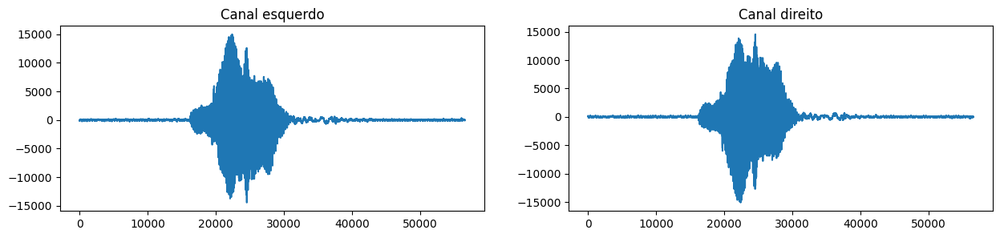

In [96]:
sinal_B = np.copy(sinal)

a = -1
sinal_B[:, 0] = a * sinal[:, 0]

fig, axs = plt.subplots(1,2, figsize=(15, 3))
axs[0].plot(sinal_B[:,0])
axs[0].set_title('Canal esquerdo')
axs[1].plot(sinal_B[:,1])
axs[1].set_title('Canal direito')

sw.write('data/atividade_8/zero_B.wav', fa, sinal_B)
Id.Audio('data/atividade_8/zero_B.wav')

c) <br>

\begin{equation}
x(t) + a
\end{equation}

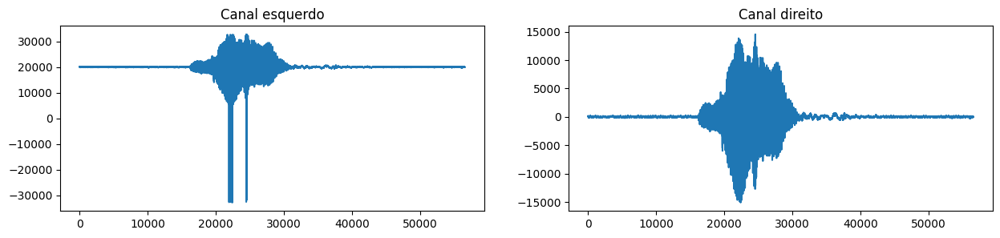

In [97]:
sinal_C = np.copy(sinal)

a = 20000
sinal_C[:, 0] = a + sinal[:, 0]

fig, axs = plt.subplots(1,2, figsize=(15, 3))
axs[0].plot(sinal_C[:,0])
axs[0].set_title('Canal esquerdo')
axs[1].plot(sinal_C[:,1])
axs[1].set_title('Canal direito')

sw.write('data/atividade_8/zero_C.wav', fa, sinal_C)
Id.Audio('data/atividade_8/zero_C.wav')

d) <br>

\begin{equation}
x(t - t_0)
\end{equation}

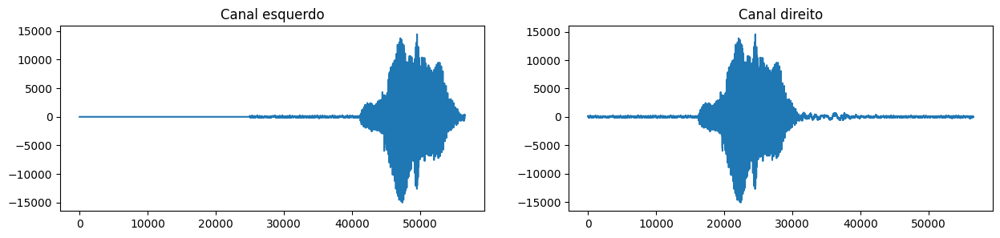

In [98]:
sinal_D = np.copy(sinal)

t0 = 25000

if t0 < len(sinal):
    sinal_D[t0:, 0] = sinal[:-t0, 0]  
    sinal_D[:t0, 0] = 0
else:
    sinal_D[:, 0] = 0

fig, axs = plt.subplots(1,2, figsize=(15, 3))
axs[0].plot(sinal_D[:,0])
axs[0].set_title('Canal esquerdo')
axs[1].plot(sinal_D[:,1])
axs[1].set_title('Canal direito')

sw.write('data/atividade_8/zero_D.wav', fa, sinal_D)
Id.Audio('data/atividade_8/zero_D.wav')

e) <br>

\begin{equation}
x(at)
\text{, com } a > 0 \\
\end{equation}

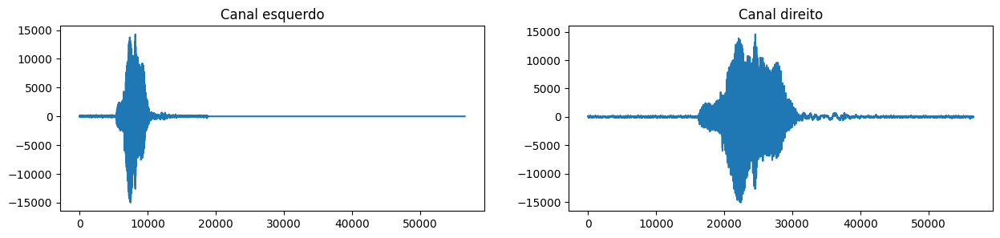

In [99]:
sinal_E = np.copy(sinal)

a = 3.0

novo_tamanho = int(len(sinal) / a)

sinal_E[:novo_tamanho, 0] = sinal[::int(a), 0]

if novo_tamanho < len(sinal):
    sinal_E[novo_tamanho:, 0] = 0

fig, axs = plt.subplots(1,2, figsize=(15, 3))
axs[0].plot(sinal_E[:,0])
axs[0].set_title('Canal esquerdo')
axs[1].plot(sinal_E[:,1])
axs[1].set_title('Canal direito')

sw.write('data/atividade_8/zero_E.wav', fa, sinal_E)
Id.Audio('data/atividade_8/zero_E.wav')

f) <br>

\begin{equation}
x(-t)
\end{equation}

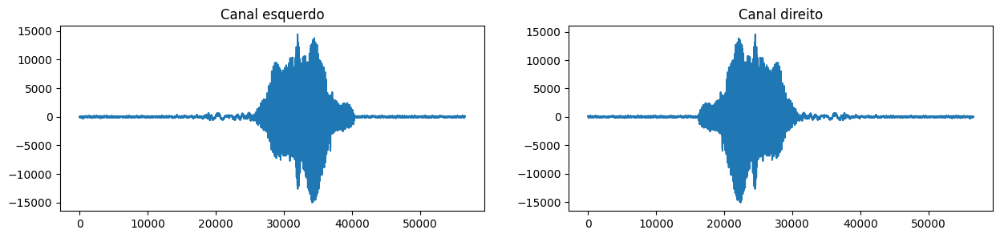

In [100]:
sinal_F = np.copy(sinal)

sinal_F[:,0] = sinal_F[:,0][::-1]

fig, axs = plt.subplots(1,2, figsize=(15, 3))
axs[0].plot(sinal_F[:,0])
axs[0].set_title('Canal esquerdo')
axs[1].plot(sinal_F[:,1])
axs[1].set_title('Canal direito')

sw.write('data/atividade_8/zero_F.wav', fa, sinal_F)
Id.Audio('data/atividade_8/zero_F.wav')

<div class="alert alert-info" style="color:#1a96f6;">
2. Grave um sinal de sua voz, com uma frase mais longa (mais que uma palavra, mas não tão longa) e realize as transformações acima para cada um dos canais do áudio obtido. Plote os gráficos e mostre os áudios de cada transformação, para cada canal.  
    __Obs: lembre de subir o arquivo de áudio junto com o notebook!__
</div>

2.1) Lendo o áudio

In [101]:
fa_jm,jm_audio = sw.read('data/atividade_8/joao_marcos.wav')

/tmp/ipykernel_11/1818716204.py:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fa_jm,jm_audio = sw.read('data/atividade_8/joao_marcos.wav')


In [102]:
jm_audio

array([[ 0,  0],
       [-1, -1],
       [-1,  0],
       ...,
       [-2, -4],
       [ 3,  5],
       [-2, -4]], dtype=int16)

In [103]:
fa_jm

48000

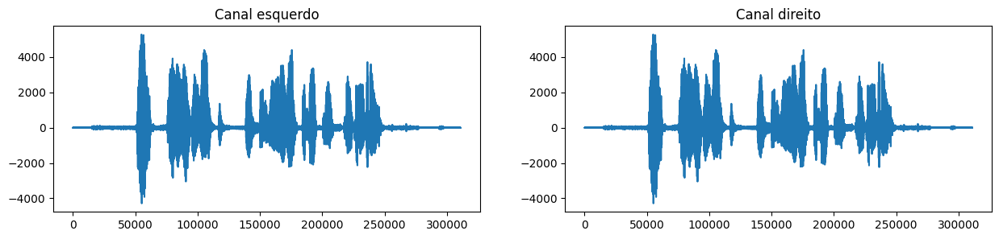

In [104]:
fig, axs = plt.subplots(1,2, figsize=(15, 3))
axs[0].plot(jm_audio[:,0])
axs[0].set_title('Canal esquerdo')
axs[1].plot(jm_audio[:,1])
axs[1].set_title('Canal direito')

Id.Audio('data/atividade_8/joao_marcos.wav')

a) <br>

\begin{equation}
a \cdot s(t)
\end{equation}

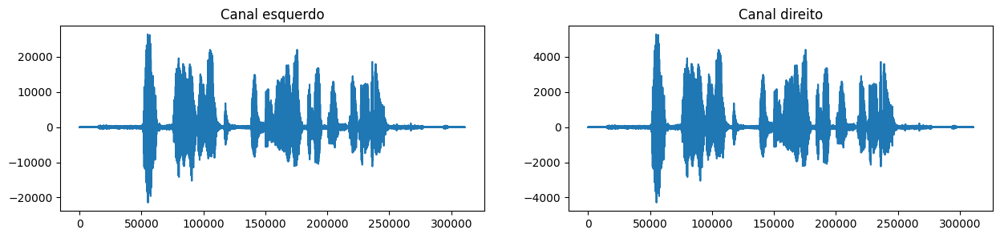

In [105]:
jm_A = np.copy(jm_audio)

a = 5
jm_A[:, 0] = a * jm_audio[:, 0]

fig, axs = plt.subplots(1,2, figsize=(15, 3))
axs[0].plot(jm_A[:,0])
axs[0].set_title('Canal esquerdo')
axs[1].plot(jm_A[:,1])
axs[1].set_title('Canal direito')

sw.write('data/atividade_8/jm_A.wav', fa_jm, jm_A)
Id.Audio('data/atividade_8/jm_A.wav')

b) <br>

\begin{equation}
- s(t)
\end{equation}

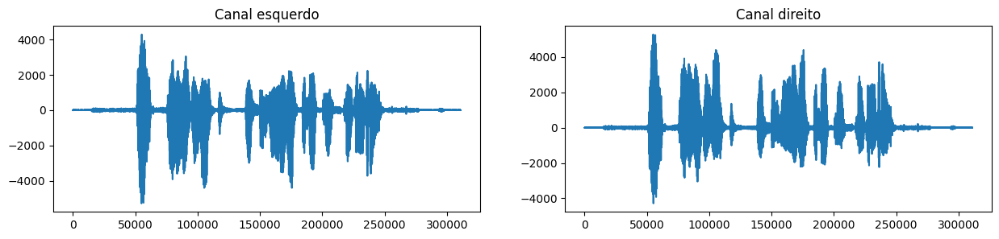

In [106]:
jm_B = np.copy(jm_audio)

a = -1
jm_B[:, 0] = a * jm_audio[:, 0]

fig, axs = plt.subplots(1,2, figsize=(15, 3))
axs[0].plot(jm_B[:,0])
axs[0].set_title('Canal esquerdo')
axs[1].plot(jm_B[:,1])
axs[1].set_title('Canal direito')

sw.write('data/atividade_8/jm_B.wav', fa_jm, jm_B)
Id.Audio('data/atividade_8/jm_B.wav')

c) <br>

\begin{equation}
x(t) + a
\end{equation}

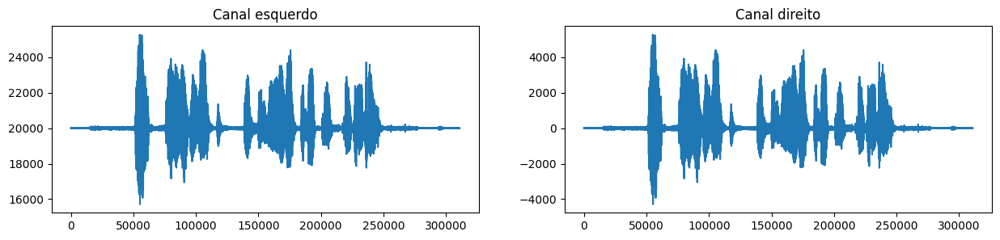

In [107]:
jm_C = np.copy(jm_audio)

a = 20000
jm_C[:, 0] = a + jm_audio[:, 0]

fig, axs = plt.subplots(1,2, figsize=(15, 3))
axs[0].plot(jm_C[:,0])
axs[0].set_title('Canal esquerdo')
axs[1].plot(jm_C[:,1])
axs[1].set_title('Canal direito')

sw.write('data/atividade_8/jm_C.wav', fa_jm, jm_C)
Id.Audio('data/atividade_8/jm_C.wav')

d) <br>

\begin{equation}
x(t - t_0)
\end{equation}

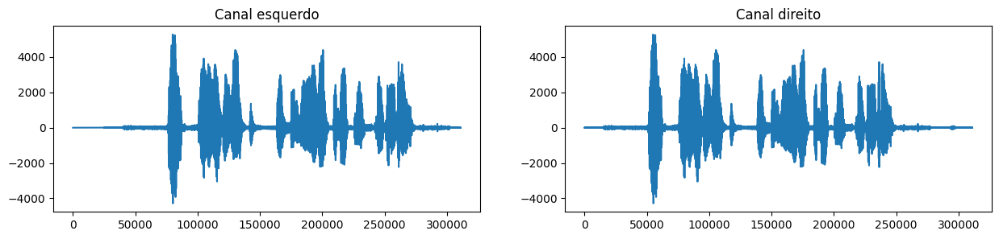

In [108]:
jm_D = np.copy(jm_audio)

t0 = 25000

if t0 < len(jm_audio):
    jm_D[t0:, 0] = jm_audio[:-t0, 0]  
    jm_D[:t0, 0] = 0
else:
    jm_D[:, 0] = 0

fig, axs = plt.subplots(1,2, figsize=(15, 3))
axs[0].plot(jm_D[:,0])
axs[0].set_title('Canal esquerdo')
axs[1].plot(jm_D[:,1])
axs[1].set_title('Canal direito')

sw.write('data/atividade_8/jm_D.wav', fa_jm, jm_D)
Id.Audio('data/atividade_8/jm_D.wav')

e) <br>

\begin{equation}
x(at)
\text{, com } a > 0 \\
\end{equation}

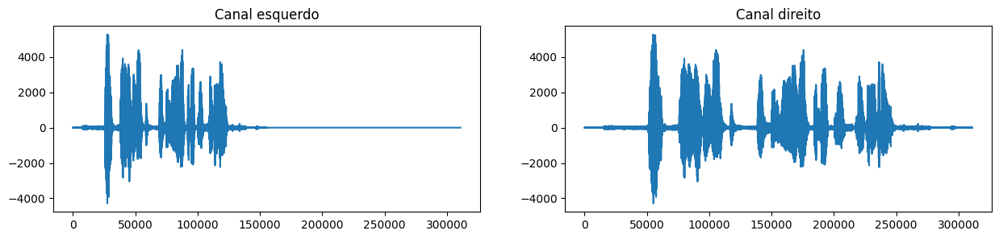

In [109]:
jm_E = np.copy(jm_audio)

a = 2.0

novo_tamanho = int(len(jm_audio) / a)

jm_E[:novo_tamanho, 0] = jm_audio[::int(a), 0]

if novo_tamanho < len(jm_audio):
    jm_E[novo_tamanho:, 0] = 0

fig, axs = plt.subplots(1,2, figsize=(15, 3))
axs[0].plot(jm_E[:,0])
axs[0].set_title('Canal esquerdo')
axs[1].plot(jm_E[:,1])
axs[1].set_title('Canal direito')

sw.write('data/atividade_8/jm_E.wav', fa_jm, jm_E)
Id.Audio('data/atividade_8/jm_E.wav')

f) <br>

\begin{equation}
x(-t)
\end{equation}

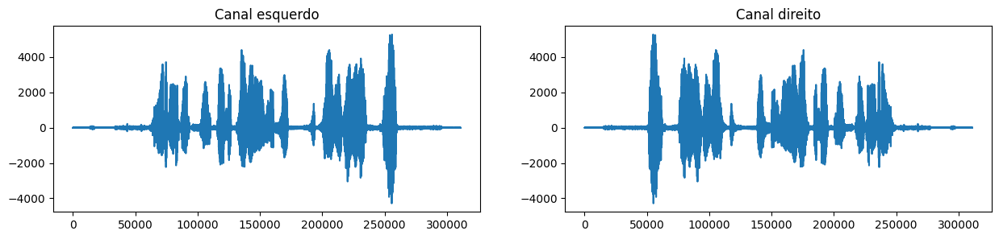

In [110]:
jm_F = np.copy(jm_audio)

jm_F[:,0] = jm_F[:,0][::-1]

fig, axs = plt.subplots(1,2, figsize=(15, 3))
axs[0].plot(jm_F[:,0])
axs[0].set_title('Canal esquerdo')
axs[1].plot(jm_F[:,1])
axs[1].set_title('Canal direito')

sw.write('data/atividade_8/jm_F.wav', fa_jm, jm_F)
Id.Audio('data/atividade_8/jm_F.wav')